# Основной код разметки новостей по тональности и выделение Attention

Данный код выполняет анализ сентимента новостных заголовков для нескольких компаний с помощью предобученной модели BERT.
- Использует модель BERT для предсказания сентимента (позитивный, нейтральный, негативный) по заголовкам новостей.
- Работает с несколькими компаниями одновременно, сохраняя результат для каждой компании.
- Обрабатывает новости и сохраняет результаты анализа в новый CSV-файл.



In [ ]:
# Подключение Google Диска
from google.colab import drive
drive.mount('/content/drive')

import torch
import pandas as pd
from transformers import BertTokenizer, BertModel
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm  # Прогресс-бар для отображения состояния

# Компании для предсказания
companies = ['SBER', 'AGRO', 'CHMF', 'MTSS', 'SIBN', 'SMLT', 'VKCO', 'YNDX']

# Модель BERT с несколькими выходными слоями для каждой компании
class MultiTaskBERT(nn.Module):
    def __init__(self, num_companies):
        super(MultiTaskBERT, self).__init__()
        self.bert = BertModel.from_pretrained('DeepPavlov/rubert-base-cased', output_attentions=True)
        self.company_heads = nn.ModuleList([nn.Linear(self.bert.config.hidden_size, 3) for _ in range(num_companies)])

    def forward(self, input_ids, attention_mask):
        bert_output = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        cls_output = bert_output.pooler_output
        company_outputs = [head(cls_output) for head in self.company_heads]
        attentions = bert_output.attentions
        return company_outputs, attentions

# Инициализация модели и токенизатора
model = MultiTaskBERT(len(companies))
tokenizer = BertTokenizer.from_pretrained('DeepPavlov/rubert-base-cased')

# Функция для получения сентимента и Attention-весов
def get_sentiment(text):
    # Проверка на пустые строки или некорректные значения
    if not isinstance(text, str) or not text.strip():
        return [torch.tensor([0.33, 0.33, 0.33])] * len(companies)  # Возвращаем нейтральные вероятности, если текст некорректен
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    outputs, attentions = model(input_ids=inputs['input_ids'], attention_mask=inputs['attention_mask'])
    probabilities = [F.softmax(output, dim=-1) for output in outputs]
    return probabilities

# Чтение файла CSV с заголовками и ссылками с Google Диска
file_path = '/content/drive/MyDrive/News_Data_with_Sequential_Dates_and_Times.csv'  # Путь к загруженному файлу CSV
df = pd.read_csv(file_path, header=None, names=['Заголовок', 'Ссылка'])  # Устанавливаем заголовки столбцов

# Инициализируем новые столбцы для сентимента каждой компании
for company in companies:
    df[f'{company}_sentiment'] = None

# Обработка каждой новости с прогрессом
for i, row in tqdm(df.iterrows(), total=len(df), desc="Разметка новостей"):
    headline = row['Заголовок']  # Берем заголовок из первого столбца

    # Получаем сентимент для заголовка, добавлена проверка на пустоту
    headline_probs = get_sentiment(headline)

    # Рассчитываем сентимент для каждой компании на основе заголовка
    for company, headline_prob in zip(companies, headline_probs):
      df.at[i, f'{company}_sentiment'] = str(headline_prob.detach().numpy().tolist())



# Сохраняем обновленный датасет в CSV на Google Диск
output_path = '/content/drive/My Drive/news_with_sentiment.csv'
df.to_csv(output_path, index=False)
print(f"Разметка завершена. Файл сохранен: {output_path}")


#Сравнение Attention и LIME

Данный код выполняет анализ новостных заголовков с использованием механизма внимания (Attention) и метода интерпретации LIME.

- Использует модель BERT для предсказания сентимента новостей.
- Визуализирует внимание модели к отдельным токенам.
- Сравнивает результаты интерпретации через LIME и механизм внимания.


In [1]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=10ca7c4aa570492c5a7434ed54c252d7c4b59e42f96de7b14f3eb5c0a4983b90
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Используется устройство: cuda


Some weights of the model checkpoint at DeepPavlov/rubert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Анализ новостей:   0%|          | 0/10 [00:00<?, ?it/s]

Текст: Акции Газпрома упали на фоне снижения цен на нефть.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3553, 0.3609, 0.2839]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


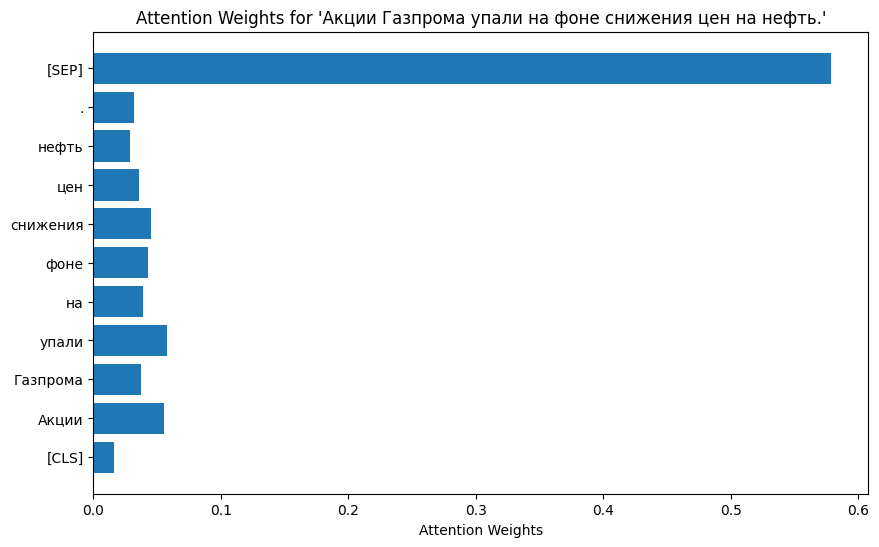

Анализ новостей:  10%|█         | 1/10 [00:00<00:04,  1.91it/s]

Текст: Центробанк повысил ключевую ставку на фоне инфляционного давления.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3508, 0.3837, 0.2655]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


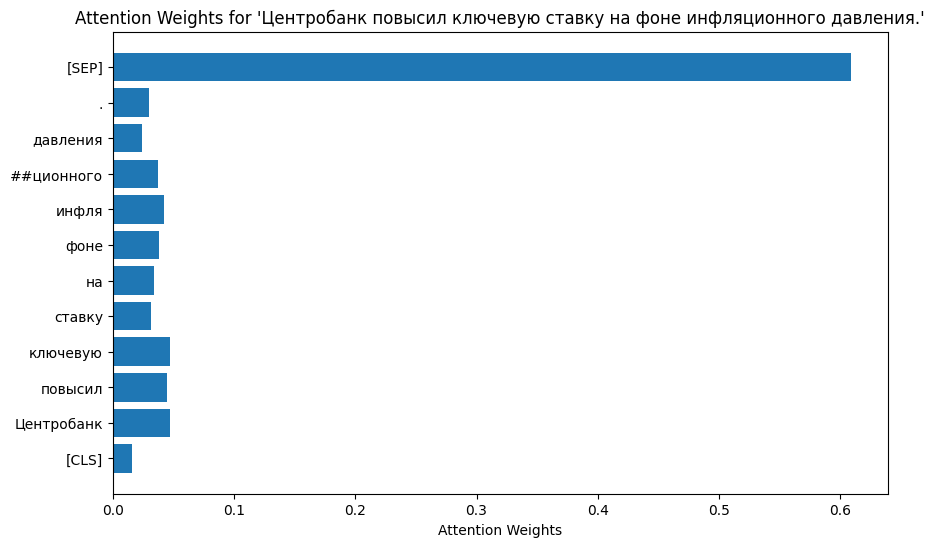

Анализ новостей:  20%|██        | 2/10 [00:01<00:04,  1.73it/s]

Текст: Apple представила новые модели iPhone с усовершенствованными камерами.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3503, 0.3630, 0.2867]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


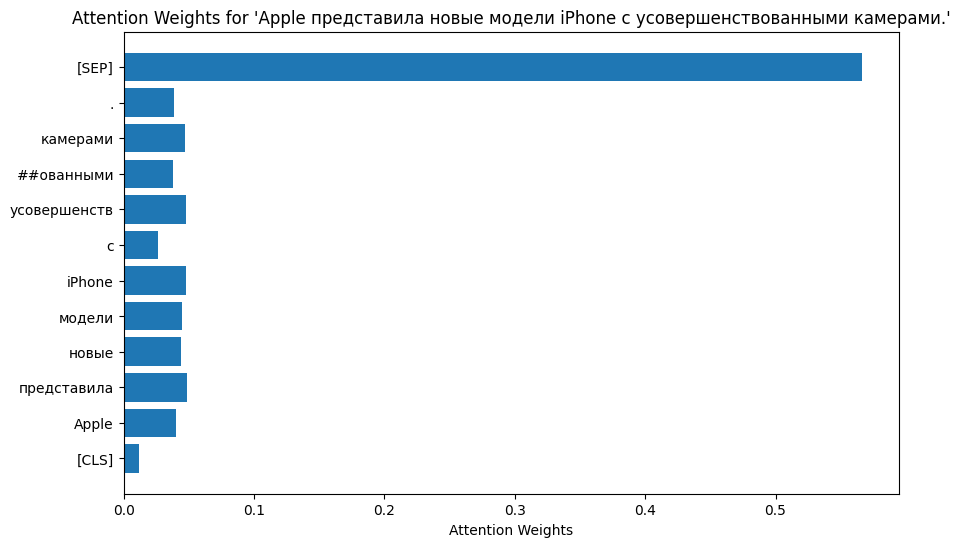

Анализ новостей:  30%|███       | 3/10 [00:01<00:04,  1.46it/s]

Текст: Tesla достигла рекордных продаж электромобилей в Европе.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3450, 0.3595, 0.2956]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


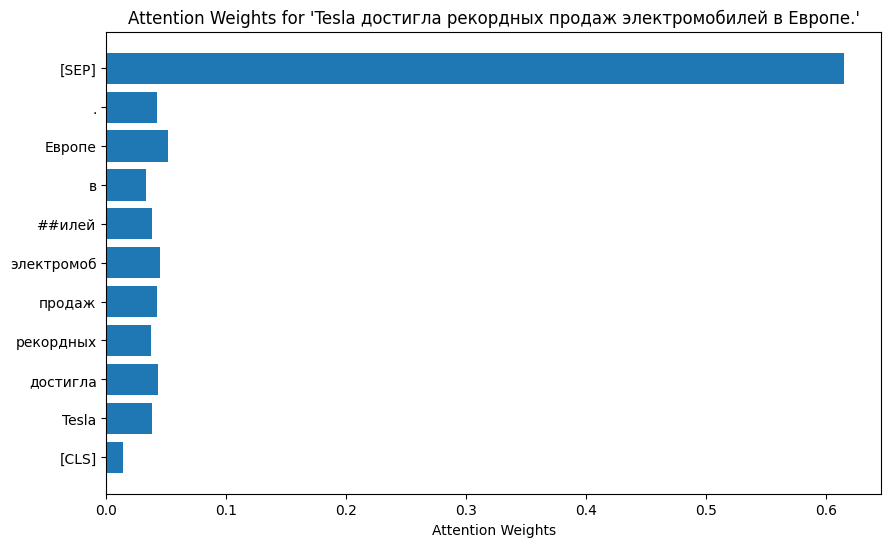

Анализ новостей:  40%|████      | 4/10 [00:02<00:03,  1.59it/s]

Текст: Рост курса рубля замедлился из-за падения цен на энергоносители.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3520, 0.3881, 0.2599]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


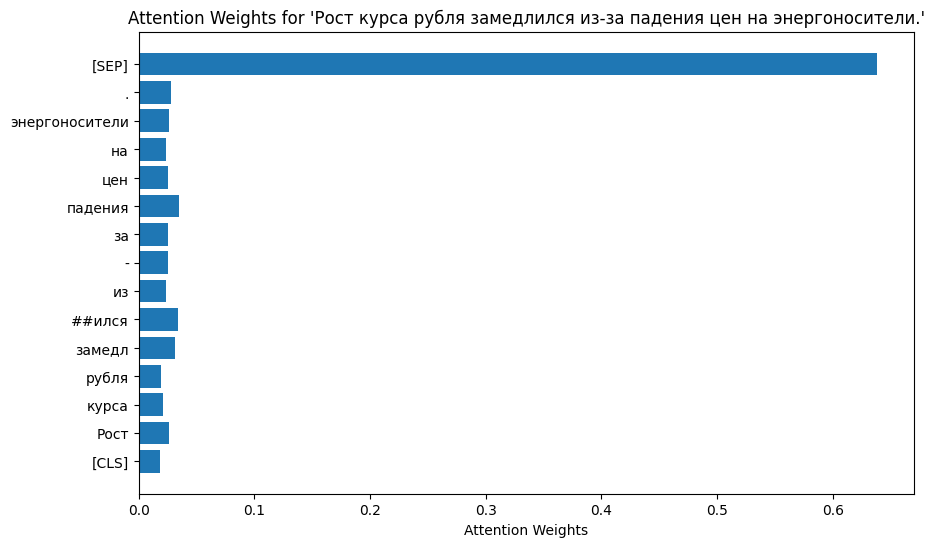

Анализ новостей:  50%|█████     | 5/10 [00:03<00:03,  1.64it/s]

Текст: Федеральная антимонопольная служба начала проверку цен на бензин в регионах.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3539, 0.3639, 0.2822]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


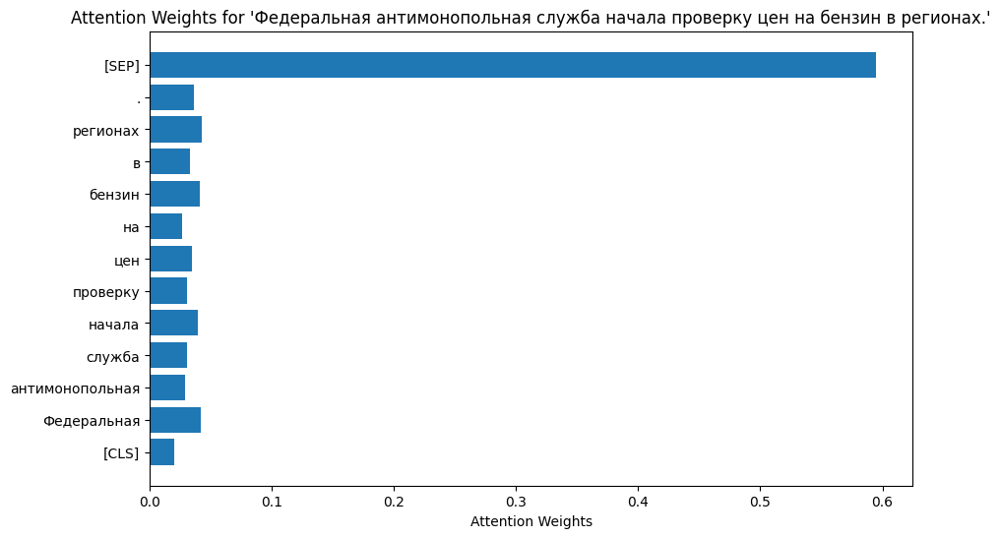

Анализ новостей:  60%|██████    | 6/10 [00:03<00:02,  1.72it/s]

Текст: Правительство обсуждает новые меры поддержки малого бизнеса.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3535, 0.3646, 0.2820]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


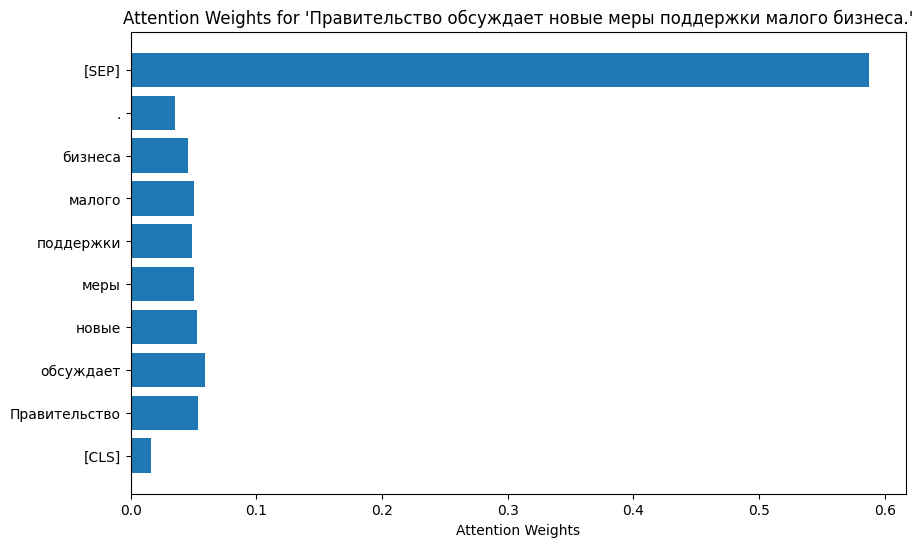

Анализ новостей:  70%|███████   | 7/10 [00:04<00:01,  1.86it/s]

Текст: Криптовалюта биткойн вновь преодолела отметку в 60 тысяч долларов.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3469, 0.2953, 0.3578]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


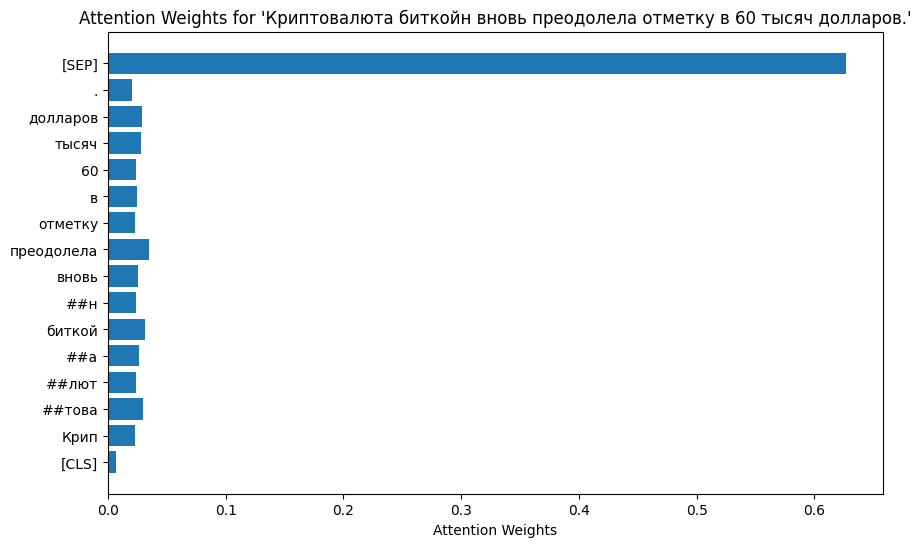

Анализ новостей:  80%|████████  | 8/10 [00:04<00:01,  1.77it/s]

Текст: Amazon анонсировала запуск новой подписной службы для доставки продуктов.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3439, 0.3544, 0.3017]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


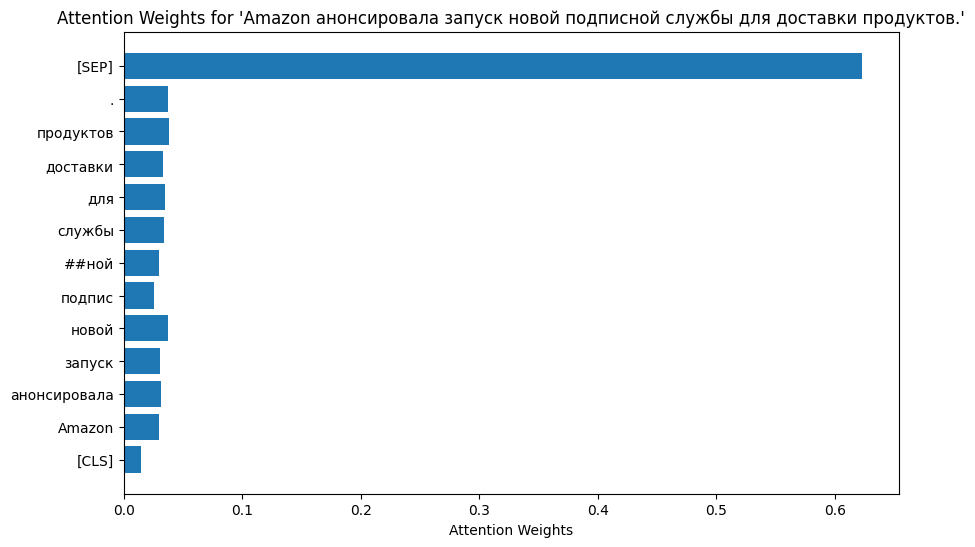

Анализ новостей:  90%|█████████ | 9/10 [00:05<00:00,  1.87it/s]

Текст: Мировой рынок полупроводников восстанавливается после глобального дефицита.
Вероятности (негативный, нейтральный, позитивный): tensor([[0.3472, 0.3798, 0.2730]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


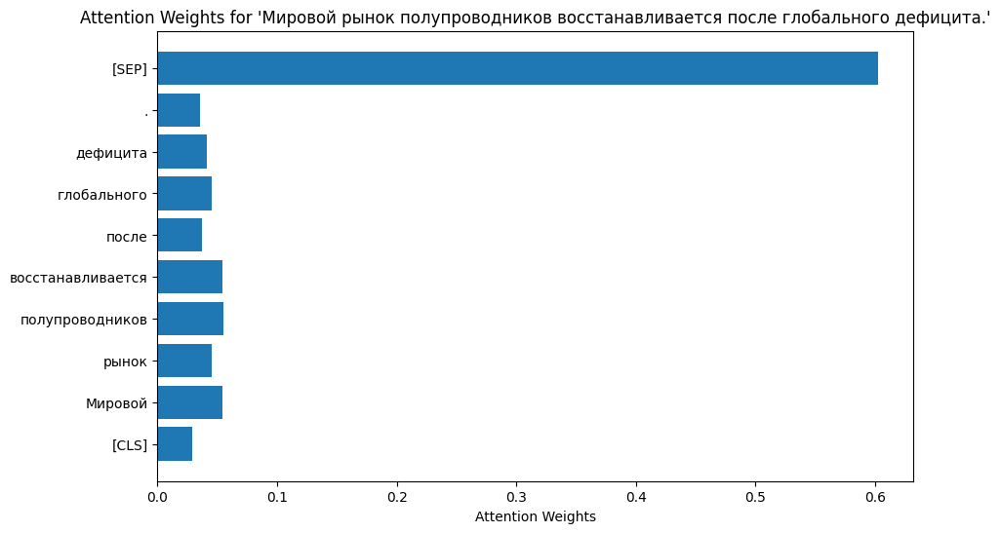

Анализ новостей: 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


In [18]:
# Подключение Google Диска для загрузки модели и данных
from google.colab import drive
drive.mount('/content/drive')

# Импорт библиотек для работы с моделью и интерпретацией
import torch
import pandas as pd
from transformers import BertTokenizer, BertModel
import torch.nn.functional as F
from lime.lime_text import LimeTextExplainer
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# Проверка на наличие GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Используется устройство: {device}")

# Подготовка модели и токенизатора
class MultiTaskBERT(torch.nn.Module):
    def __init__(self):
        super(MultiTaskBERT, self).__init__()
        self.bert = BertModel.from_pretrained('DeepPavlov/rubert-base-cased', output_attentions=True)
        self.classifier = torch.nn.Linear(self.bert.config.hidden_size, 3)  # 3 класса сентимента: негативный, нейтральный, позитивный

    def forward(self, input_ids, attention_mask):
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        cls_output = outputs.pooler_output  # Используем CLS-токен для классификации
        attentions = outputs.attentions  # Веса внимания
        logits = self.classifier(cls_output)  # Классификация
        return logits, attentions

# Инициализация модели и токенизатора
model = MultiTaskBERT().to(device)
tokenizer = BertTokenizer.from_pretrained('DeepPavlov/rubert-base-cased')

# Функция для получения сентимента и внимания
def get_sentiment_and_attention(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=256)  # Ограничение длины до 256 токенов
    inputs = {key: value.to(device) for key, value in inputs.items()}  # Перенос на устройство (CPU/GPU)
    logits, attentions = model(input_ids=inputs['input_ids'], attention_mask=inputs['attention_mask'])
    probabilities = F.softmax(logits, dim=-1)  # Преобразуем выходы модели в вероятности классов
    return probabilities, attentions, inputs['input_ids']

# Инициализация LIME
explainer = LimeTextExplainer(class_names=['negative', 'neutral', 'positive'])

# Функция для предсказания с помощью LIME
def predict_fn(texts):
    inputs = tokenizer(texts, return_tensors="pt", truncation=True, padding=True, max_length=256)
    inputs = {key: value.to(device) for key, value in inputs.items()}  # Перенос на устройство (CPU/GPU)
    logits, _ = model(input_ids=inputs['input_ids'], attention_mask=inputs['attention_mask'])
    probabilities = F.softmax(logits, dim=-1).detach().cpu().numpy()
    return probabilities

# Функция для объяснения через LIME
def explain_with_lime(text):
    # Получаем объяснение через LIME (уменьшено до 100 выборок для ускорения)
    exp = explainer.explain_instance(text, predict_fn, num_features=10, num_samples=100)
    return exp

# Функция для отображения внимания
def visualize_attention(text, attentions, input_ids):
    # Извлекаем токены
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0].cpu().numpy())

    # Используем последний слой внимания и усредняем его по всем головам внимания
    attention_weights = attentions[-1].mean(dim=1).mean(dim=1).detach().cpu().numpy()[0]

    # Визуализация токенов и их весов внимания
    plt.figure(figsize=(10, 6))
    plt.barh(tokens[:len(attention_weights)], attention_weights[:len(tokens)])
    plt.xlabel("Attention Weights")
    plt.title(f"Attention Weights for '{text}'")
    plt.show()


# Функция для сравнения внимания и LIME
def compare_attention_and_lime(text):
    # Получаем сентимент, веса внимания и токены от модели
    probabilities, attentions, input_ids = get_sentiment_and_attention(text)

    # Отображаем результаты предсказания
    print(f"Текст: {text}")
    print(f"Вероятности (негативный, нейтральный, позитивный): {probabilities}")

    # Визуализируем внимание
    visualize_attention(text, attentions, input_ids)

    # Получаем объяснение через LIME и визуализируем важные слова
    lime_exp = explain_with_lime(text)
    lime_exp.show_in_notebook(text=text)

# Список 10 новостных заголовков для анализа
news_list = [
    "Акции Газпрома упали на фоне снижения цен на нефть.",
    "Центробанк повысил ключевую ставку на фоне инфляционного давления.",
    "Apple представила новые модели iPhone с усовершенствованными камерами.",
    "Tesla достигла рекордных продаж электромобилей в Европе.",
    "Рост курса рубля замедлился из-за падения цен на энергоносители.",
    "Федеральная антимонопольная служба начала проверку цен на бензин в регионах.",
    "Правительство обсуждает новые меры поддержки малого бизнеса.",
    "Криптовалюта биткойн вновь преодолела отметку в 60 тысяч долларов.",
    "Amazon анонсировала запуск новой подписной службы для доставки продуктов.",
    "Мировой рынок полупроводников восстанавливается после глобального дефицита."
]

# Проводим исследование на 10 новостях
for news in tqdm(news_list, desc="Анализ новостей"):
    compare_attention_and_lime(news)
